In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Brightness correction


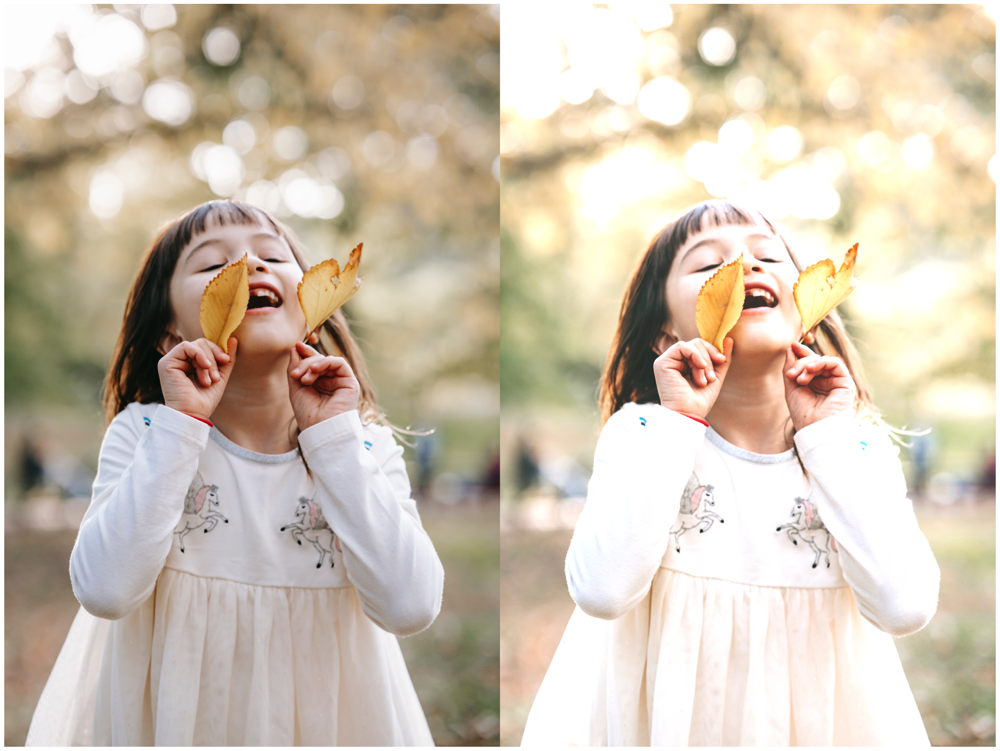

In [4]:
def adjust_brightness_contrast(image, alpha, beta):
    return cv2.addWeighted(image, alpha, image, 0, beta)

image = cv2.imread('girl.jpg')
enhanced_image = adjust_brightness_contrast(image, 1.2, 30)
original_and_enhanced_image = np.hstack((image, enhanced_image))

plt.figure(figsize = [30, 30])
plt.axis('off')
plt.imshow(original_and_enhanced_image [:,:,::-1])

# Sharpening Images

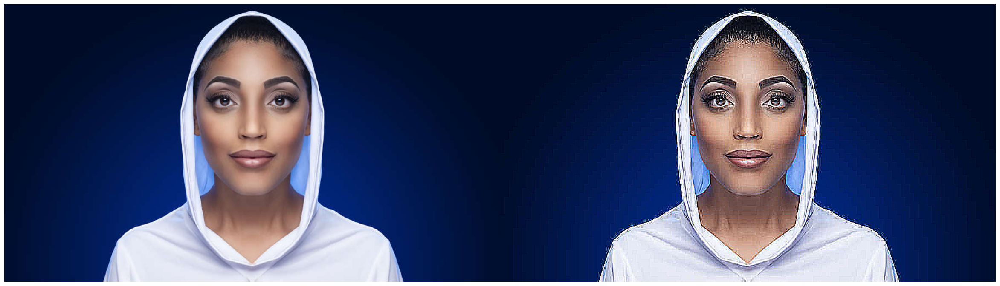

In [5]:
def sharpen_image(image):
    kernel = np.array([[-1, -1, -1],
                       [-1, 9, -1],
                       [-1, -1, -1]])
    return cv2.filter2D(image, -1, kernel)

image = cv2.imread('women.jpg')
sharpened_image = sharpen_image(image)

original_and_sharpened_image = np.hstack((image, sharpened_image))

plt.figure(figsize = [30, 30])
plt.axis('off')
plt.imshow(original_and_sharpened_image[:,:,::-1])

# Adjusting Contrast

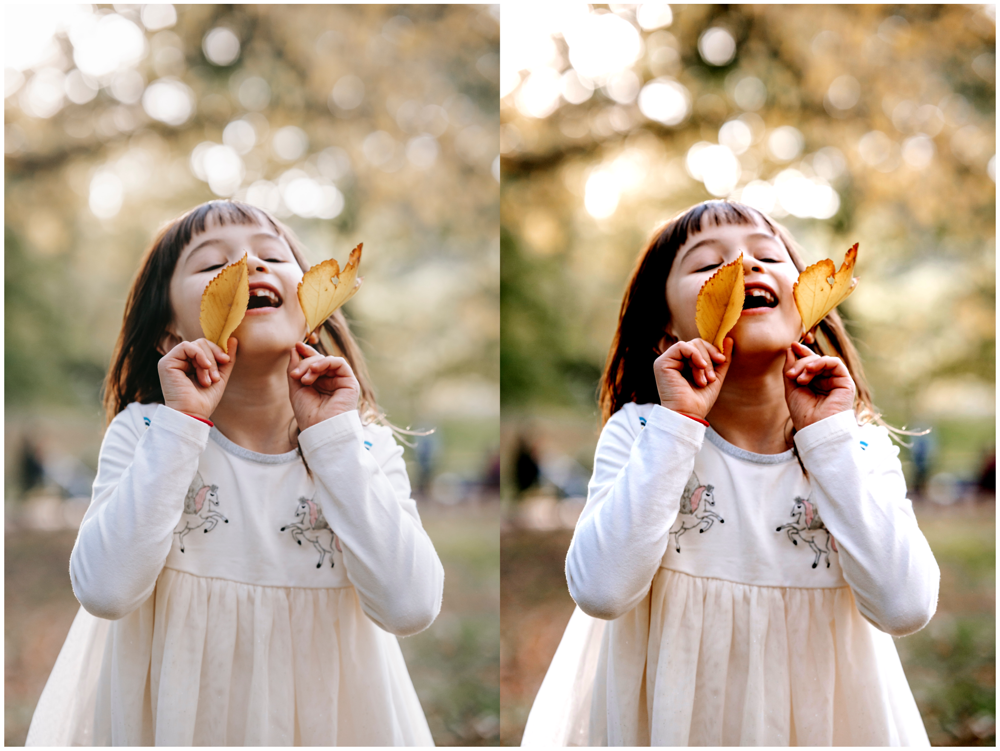

In [6]:
from PIL import Image, ImageEnhance
import numpy as np
import matplotlib.pyplot as plt

def adjust_contrast(image, factor):
    enhancer = ImageEnhance.Contrast(image)
    return enhancer.enhance(factor)

image = Image.open('girl.jpg')
enhanced_contrast = adjust_contrast(image, 1.5)

original_and_enhanced_contrast = np.hstack((image, enhanced_contrast))

plt.figure(figsize = [30, 30])
plt.axis('off')
plt.imshow(original_and_enhanced_contrast, cmap = 'gray')

# Grayscaling

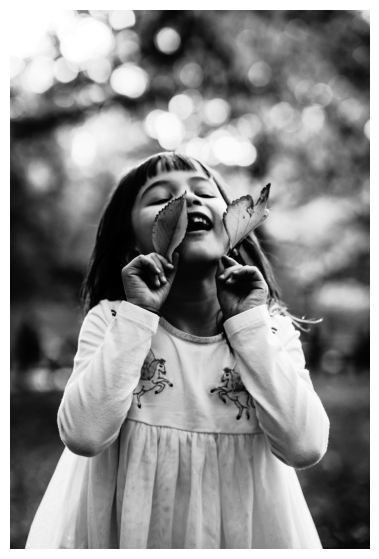

In [12]:
import cv2

image = cv2.imread('girl.jpg', 0)  # Read image in grayscale
enhanced_image = cv2.equalizeHist(image)
cv2.imwrite('enhanced.jpg', enhanced_image)
saved_image=cv2.imread('enhanced.jpg',0)

plt.figure(figsize = [30, 7])
plt.axis('off')
plt.imshow(saved_image,cmap='gray')

# Denoising

In [17]:
import cv2

image = cv2.imread('women.jpg')
denoised_image = cv2.GaussianBlur(image, (5, 5), 0)  # Gaussian blur
cv2.imwrite('denoised_women.jpg', denoised_image)

True

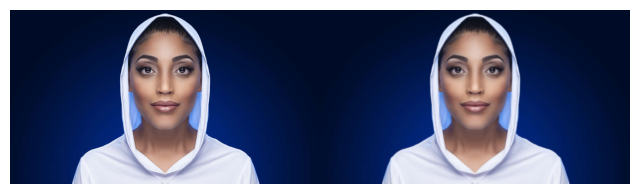

In [22]:
import cv2
import matplotlib.pyplot as plt

# Load the original color image
original_image = cv2.imread('women.jpg')
denoised_image = cv2.imread('denoised_women.jpg')


original_and_sharpened_image = np.hstack((original_image, denoised_image))
# Display the original color image
plt.figure(figsize=[8, 8])
plt.axis('off')
plt.imshow(original_and_sharpened_image[:,:,::-1])  # Convert BGR to RGB for Matplotlib
plt.show()

# Contrast Limited Adaptive Histogram Equalization (CLAHE)

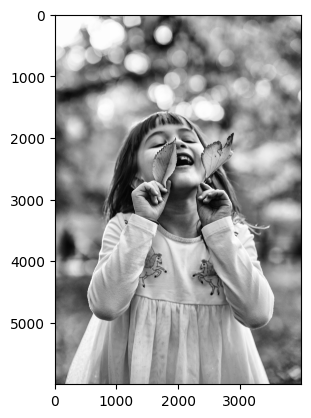

In [27]:
import cv2

image = cv2.imread('girl.jpg', 0)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
enhanced_image = clahe.apply(image)
cv2.imwrite('enhanced.jpg', enhanced_image)

plt.imshow(cv2.cvtColor(enhanced_image, cv2.COLOR_BGR2RGB))
plt.show()

<h6> CLAHE (Contrast Limited Adaptive Histogram Equalization) is an image enhancement technique that improves contrast and enhances local details while limiting intensity clipping in varying regions of an image. </h6>

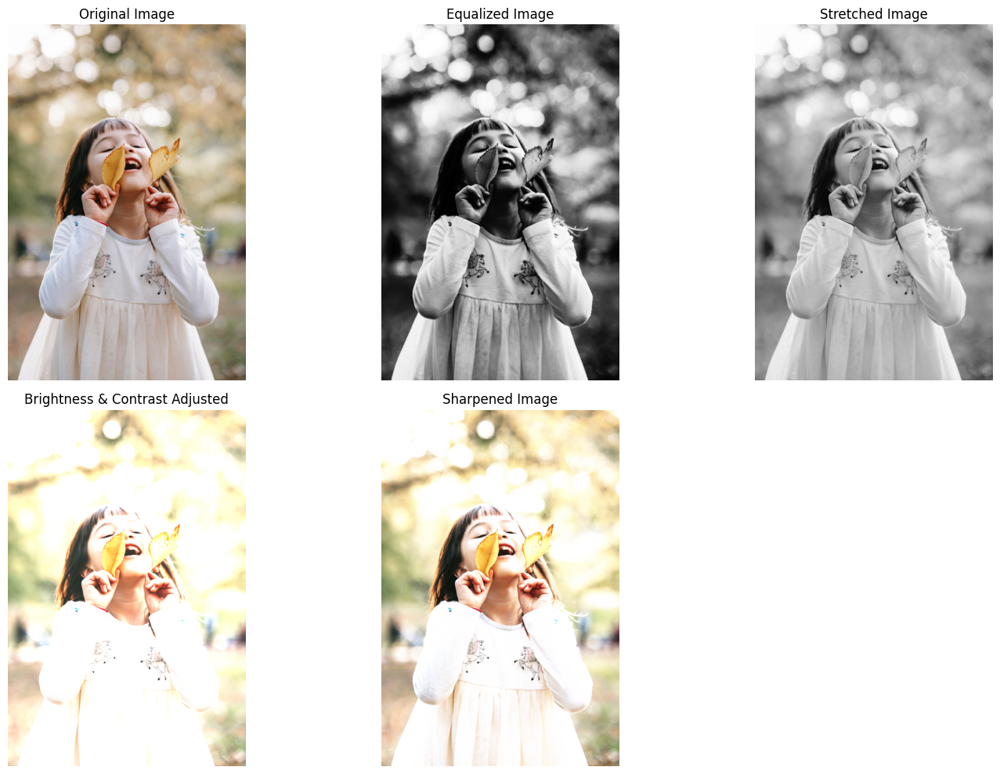

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function for Histogram Equalization
def histogram_equalization(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized_image = cv2.equalizeHist(gray_image)
    return equalized_image

# Function for Contrast Stretching
def contrast_stretching(image, min_out=0, max_out=255):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    min_in = np.min(gray_image)
    max_in = np.max(gray_image)
    stretched_image = ((gray_image - min_in) / (max_in - min_in)) * (max_out - min_out) + min_out
    stretched_image = np.clip(stretched_image, min_out, max_out).astype(np.uint8)
    return stretched_image

# Function for adjusting brightness and contrast
def adjust_brightness_contrast(image, alpha=1.0, beta=0.0):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

# Function for sharpening the image
def sharpen_image(image, alpha=1.5):
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    sharpened_image = cv2.filter2D(image, -1, alpha * kernel)
    return sharpened_image

# Load the image
image = cv2.imread('girl.jpg')

# Perform Histogram Equalization
equalized_image = histogram_equalization(image)

# Perform Contrast Stretching
stretched_image = contrast_stretching(image)

# Adjust Brightness and Contrast
adjusted_image = adjust_brightness_contrast(image, alpha=1.5, beta=30)

# Sharpen the Image
sharpened_image = sharpen_image(image, alpha=1.5)

# Display original and enhanced images
def display_images(images, titles):
    plt.figure(figsize=(15, 10))
    for i in range(len(images)):
        plt.subplot(2, 3, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Display the images
images = [image, equalized_image, stretched_image, adjusted_image, sharpened_image]
titles = ['Original Image', 'Equalized Image', 'Stretched Image', 'Brightness & Contrast Adjusted', 'Sharpened Image']
display_images(images, titles)


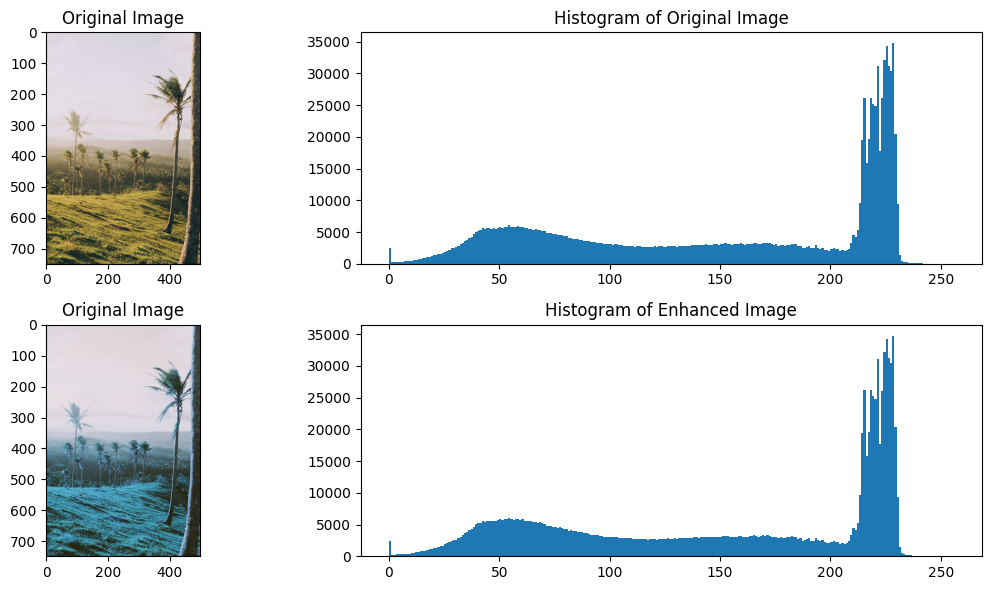

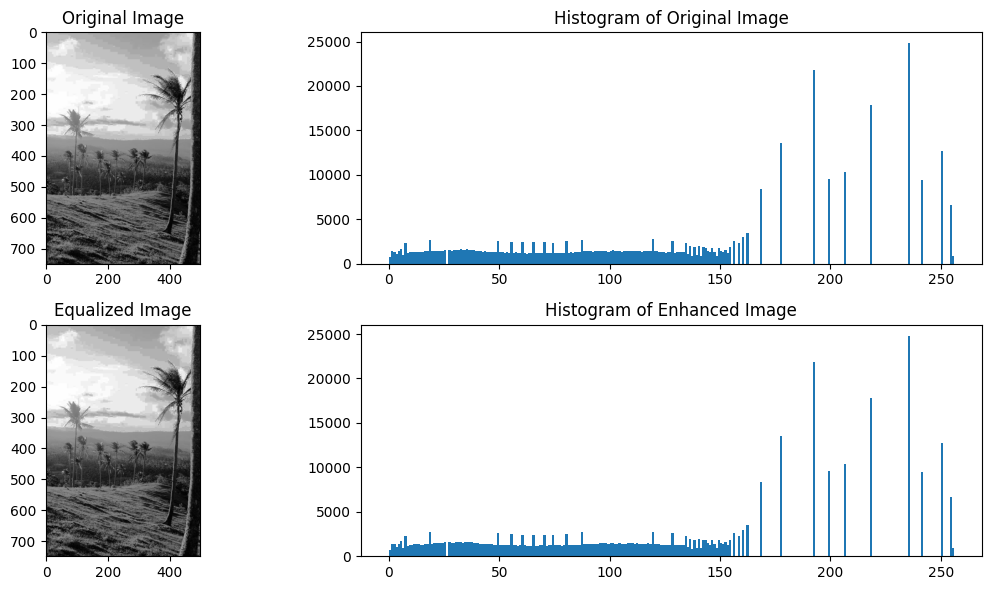

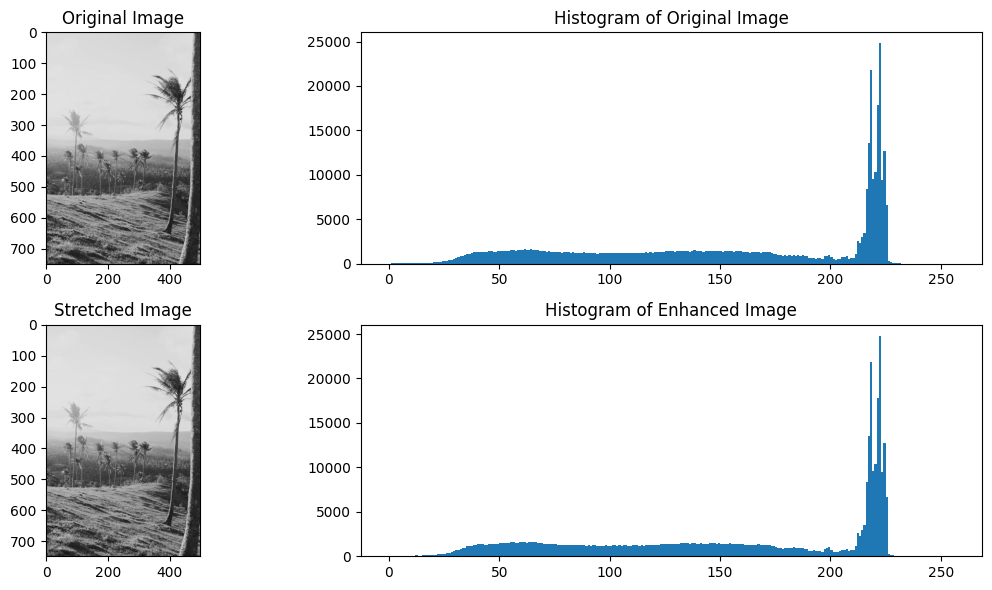

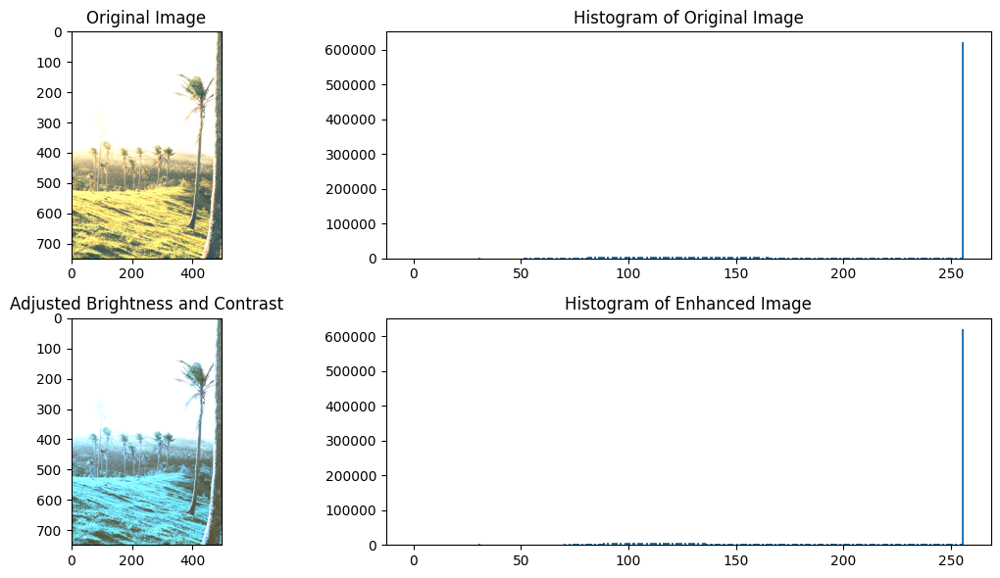

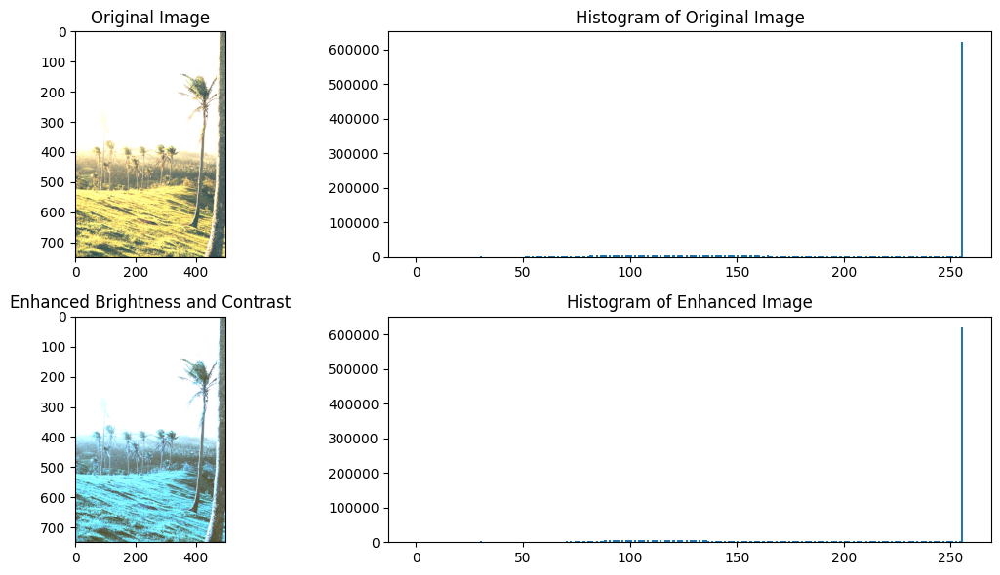

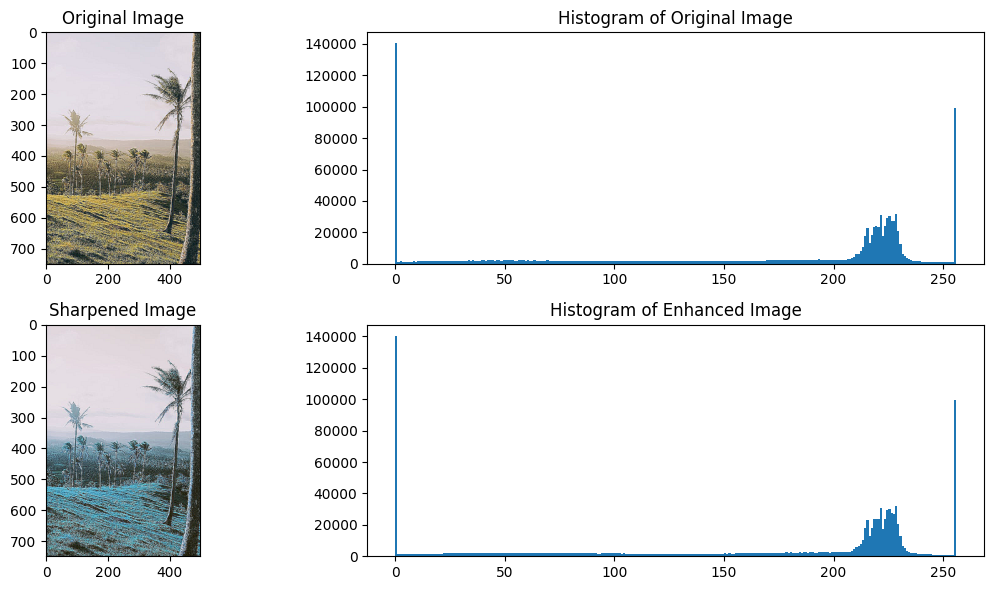

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function for Histogram Equalization
def histogram_equalization(image):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized_image = cv2.equalizeHist(gray_image)
    return equalized_image

# Function for Contrast Stretching
def contrast_stretching(image, min_out=0, max_out=255):
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    min_in = np.min(gray_image)
    max_in = np.max(gray_image)
    stretched_image = ((gray_image - min_in) / (max_in - min_in)) * (max_out - min_out) + min_out
    stretched_image = np.clip(stretched_image, min_out, max_out).astype(np.uint8)
    return stretched_image

# Function to adjust Brightness and Contrast
def adjust_brightness_contrast(image, alpha=1.0, beta=0):
    adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return adjusted_image

# Function to enhance Brightness and Contrast
def enhance_brightness_contrast(image, alpha=1.2, beta=10):
    enhanced_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return enhanced_image

# Function to sharpen the image
def sharpen_image(image):
    kernel = np.array([[-1, -1, -1],
                       [-1,  9, -1],
                       [-1, -1, -1]])
    sharpened_image = cv2.filter2D(image, -1, kernel)
    return sharpened_image

# Load the image
image = cv2.imread('nature.jpeg')

# Perform various enhancements
equalized_image = histogram_equalization(image)
stretched_image = contrast_stretching(image)
adjusted_image = adjust_brightness_contrast(image, alpha=1.5, beta=30)
enhanced_image = enhance_brightness_contrast(image, alpha=1.5, beta=30)
sharpened_image = sharpen_image(image)

# Display images and histograms
def display_image_and_histogram(image, title):
    plt.figure(figsize=(12, 6))

    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    plt.subplot(2, 2, 2)
    plt.hist(image.ravel(), 256, [0, 256])
    plt.title('Histogram of Original Image')

    plt.subplot(2, 2, 3)
    plt.imshow(image, cmap='gray')
    plt.title(title)

    plt.subplot(2, 2, 4)
    plt.hist(image.ravel(), 256, [0, 256])
    plt.title('Histogram of Enhanced Image')

    plt.tight_layout()
    plt.show()

# Display the images and histograms
display_image_and_histogram(image, 'Original Image')
display_image_and_histogram(equalized_image, 'Equalized Image')
display_image_and_histogram(stretched_image, 'Stretched Image')
display_image_and_histogram(adjusted_image, 'Adjusted Brightness and Contrast')
display_image_and_histogram(enhanced_image, 'Enhanced Brightness and Contrast')
display_image_and_histogram(sharpened_image, 'Sharpened Image')


# Brain Scan Image

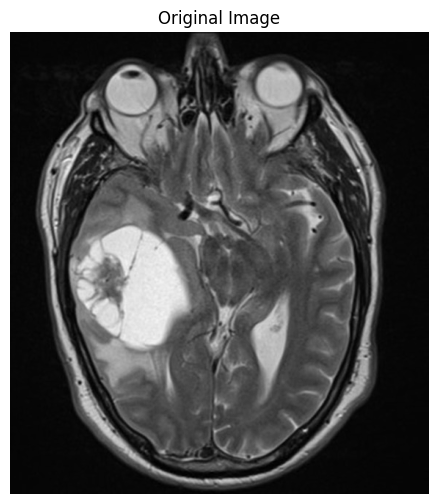

In [34]:
import cv2
import matplotlib.pyplot as plt

# Load the original brain scan image
image = cv2.imread('brain_scan.jpeg', 0)

# Display the original image
plt.figure(figsize=[6, 6])
plt.title('Original Image')
plt.axis('off')
plt.imshow(image, cmap='gray')
plt.show()

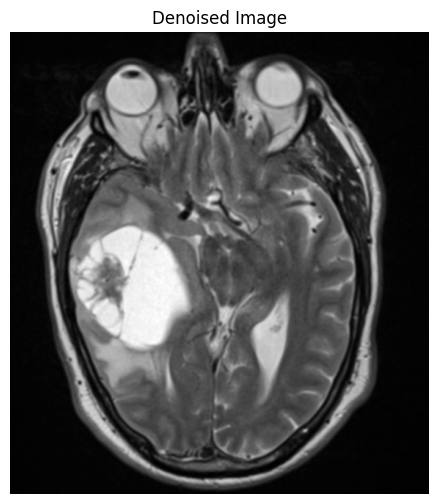

In [35]:

# Apply Gaussian Blur for Noise Reduction
denoised_image = cv2.GaussianBlur(image, (5, 5), 0)
plt.figure(figsize=[6, 6])
plt.title('Denoised Image')
plt.axis('off')
plt.imshow(denoised_image, cmap='gray')
plt.show()



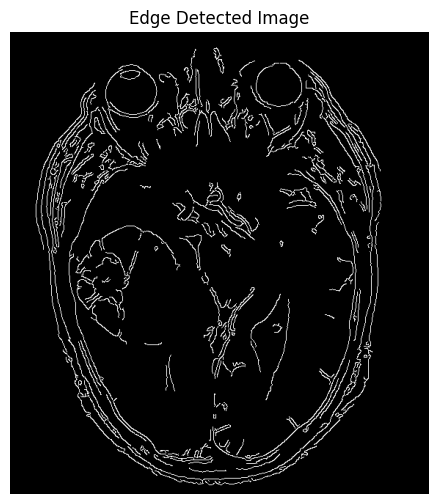

In [36]:
# Apply Canny Edge Detection
edge_detected_image = cv2.Canny(image, 100, 200)  # Adjust threshold values as needed
plt.figure(figsize=[6, 6])
plt.title('Edge Detected Image')
plt.axis('off')
plt.imshow(edge_detected_image, cmap='gray')
plt.show()


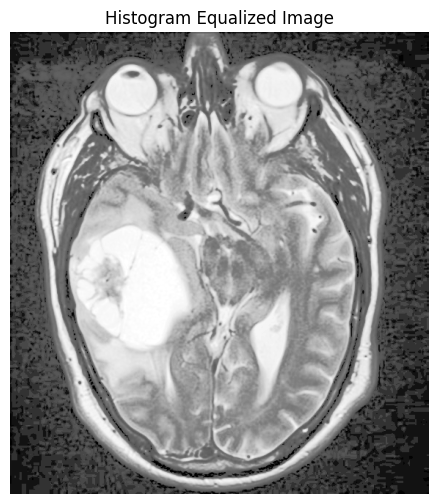

In [37]:

# Apply Histogram Equalization
histogram_equalized_image = cv2.equalizeHist(image)
plt.figure(figsize=[6, 6])
plt.title('Histogram Equalized Image')
plt.axis('off')
plt.imshow(histogram_equalized_image, cmap='gray')
plt.show()

### Original Image
The original brain scan image provides the base for our analysis. It is essential to understand the starting point of our image enhancement process.

### CLAHE Enhanced Image
After applying Contrast Limited Adaptive Histogram Equalization (CLAHE), we observe that the image's contrast has been improved significantly. Details within different regions of the brain scan are now more prominent, making it easier to identify specific features.

### Denoised Image
In the denoised image, Gaussian blur has been applied to reduce noise and create a smoother representation of the brain scan. Noise reduction helps enhance the clarity of structures within the image.

### Edge Detected Image
The edge-detected image is the result of applying the Canny edge detection algorithm. It highlights the edges and boundaries of structures within the brain scan. This can be particularly useful for identifying important anatomical features.

### Histogram Equalized Image
Histogram equalization has been applied to improve the overall contrast of the image. This enhancement technique redistributes pixel intensities, making both dark and bright regions more distinguishable. As a result, the image is more balanced in terms of contrast.

These image enhancements are vital steps in preprocessing brain scan data, as they enhance visibility and facilitate subsequent analysis and interpretation.
